# CloudPhysician detection-recognition pipeline

## Segmentation + Warping

### Setup & imports

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git  # Cloning the repo 
!gdown "10FTRA1EBIbENR579vdam8CNPA0Zw5PMB&confirm=t"  # Downloading the weights for custom YOLOv5
!pip install -r ./yolov5/requirements.txt             # Installing the requirements

Cloning into 'yolov5'...
remote: Enumerating objects: 15070, done.
remote: Counting objects: 100% (51/51), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 15070 (delta 26), reused 30 (delta 13), pack-reused 15019
Receiving objects: 100% (15070/15070), 14.13 MiB | 19.55 MiB/s, done.
Resolving deltas: 100% (10319/10319), done.
Downloading...
From: https://drive.google.com/uc?id=10FTRA1EBIbENR579vdam8CNPA0Zw5PMB&confirm=t
To: /content/best.pt
100% 4.04M/4.04M [00:00<00:00, 120MB/s]
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 34.9 MB/s eta 0:00:00


In [ ]:
### SEGMENTATION IMPORTS

import yolov5.segment.predict as predict
import numpy as np
import os
import cv2
from google.colab.patches import cv2_imshow
import subprocess
import matplotlib.pyplot as plt
import timeit
import time
import torch
%matplotlib inline

#disable yolov5 logging
import logging
logging.getLogger('yolov5').setLevel(logging.WARN)


### Helper functions 

In [ ]:
# Helper functions

def plotim(im_list, title_list):  # To plot a list of images and their titles
  import math
  nrows = math.ceil(len(im_list)/3)
  fig, ax = plt.subplots(nrows, 3, figsize=(nrows*30, 50))
  if nrows==1:
    for i in range(len(im_list)):
      ax[i%3].imshow(im_list[i])
      ax[i%3].set_title(title_list[i], size=22)
  else:
    for i in range(len(im_list)):
      ax[i//3, i%3].imshow(im_list[i])
      ax[i//3, i%3].set_title(title_list[i], size=22)
  plt.show()   

# Get vertices of mask bounding polygon 
def get_mask_boundary_box(filename,image):
  file_ext = os.path.splitext(filename)[1]
  basename = str(os.path.basename(filename))
  bbox=list()
  try:
    with open(f'/content/yolov5/runs/predict-seg/exp/labels/{basename.rstrip(file_ext)}.txt') as f:
      fl=0
      t=[]
      for x in next(f).split():       #reading file
        if fl==0:
          fl+=1
          continue
        if fl%2==0:
          t.append(float(x)*image.shape[0])
          bbox.append(t.copy())
        else:
          t.append(float(x)*image.shape[1])
        if(fl%2==0):
          t.clear()
        fl+=1
  except:
     bbox = [[0,0], [0, image.shape[1]], [image.shape[0], 0], [image.shape[0], image.shape[1]]]
  return bbox 


def dis2(c,d):
  return c*c+d*d

def get_screen_corners(image,mbox):       #opencv corner coordinate function
  nim2=np.zeros((image.shape[0],image.shape[1],image.shape[2]))
  nim=cv2.fillConvexPoly(nim2.copy(),np.array(mbox,np.int32),color=(255,255,255))
  img=nim
  gray = cv2.cvtColor(np.float32(img), cv2.COLOR_BGR2GRAY)
  blurred = cv2.bilateralFilter(gray, 9, 75, 75)                          #smoothes out the noise in the image
  _, thresh = cv2.threshold(np.uint8(blurred), 0, 255, cv2.THRESH_OTSU)   #automatic image thresholding

  contours, _ = cv2.findContours(np.uint8(blurred), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  contour = contours[0]

  perimeter = cv2.arcLength(contour, True)
  approx = cv2.approxPolyDP(contour, 0.05 * perimeter, True)

  dmin=10000000000
  ireq=-1
  for i in range(4):
    if dis2(approx[i][0][0],approx[i][0][1])<dmin:
      ireq=i
      dmin=dis2(approx[i][0][0],approx[i][0][1])
  return [approx[ireq][0],approx[(ireq-1+4)%4][0],approx[(ireq-2+4)%4][0],approx[(ireq-3+4)%4][0]]


def warp_image(image,corners):        #apply warping to the image
  cornersp = np.float32([corners[0], corners[1], corners[2], corners[3]])
  width, height = image.shape[1],image.shape[0]
  pts2 = np.float32([[0,0],[width,0],[width,height],[0,height]])
  matrix = cv2.getPerspectiveTransform(cornersp,pts2)
  output = cv2.warpPerspective(image,matrix,(width,height))
  return output


def run_segmentation_and_warping(impath):
  """
  Input:  impath -> Absolute path of the image we want to process
  Output: warped_image -> a np array of the warped+segmented image of the monitor
  """
  image = cv2.imread( impath )
  predict.run(weights='/content/best.pt',save_txt=True,source=impath,exist_ok=True,nosave=True)
  mbox=get_mask_boundary_box(impath,image)
  # seg_img = cv2.polylines(image.copy(),np.array([mbox],np.int32),isClosed=True,color=(255,255,0),thickness=3)
  corners=get_screen_corners(image,mbox)  #openCV corner function
  return warp_image(image,corners)

### Test block

In [ ]:
# # Test block

# # Downloading the ds
# !gdown 1aPcpumnmdIAtqEqqkRhlqVGkpQ_4wtHg
# !unzip -q small_test_dataset.zip


# # Test run
# import matplotlib.pyplot as plt

# im_path = '/content/small_test_dataset/adityawarangal_icu_mon--01_2023_1_3_14_15_1.jpeg'
# plt.imshow(plt.imread(im_path))
# plt.show()
# segim = run_segmentation_and_warping(im_path)
# plt.imshow(segim[:, :, ::-1])
# plt.show()

## Text detection

### Downloading the dataset

In [ ]:
!gdown 1dhwDW8W6dnylOBPr-l9BKGqGEM7L0gCN
!unzip -q TEXT_DETECTION_DATATEST.zip


Downloading...
From: https://drive.google.com/uc?id=1dhwDW8W6dnylOBPr-l9BKGqGEM7L0gCN
To: /content/TEXT_DETECTION_DATATEST.zip
100% 3.14M/3.14M [00:00<00:00, 203MB/s]


In [ ]:
!mkdir oklol && cp ./TEXT_DETECTION_DATATEST/1.jpeg ./oklol/

### Installations, Setup & Imports

In [ ]:
# Cloning the git repo of paddle ocr (https://github.com/PaddlePaddle/PaddleOCR.git)
!git clone https://github.com/PaddlePaddle/PaddleOCR.git
!pip3 install -r ./PaddleOCR/requirements.txt


# Removed in favor of line below
!pip install paddleocr
!python3 -m pip install Polygon3 paddlepaddle lanms -i https://pypi.tuna.tsinghua.edu.cn/simple

# !pip install paddleocr Polygon3 paddlepaddle lanms

# Setting up FCE
!wget https://paddleocr.bj.bcebos.com/contribution/det_r50_dcn_fce_ctw_v2.0_train.tar # Downloading the weights
!tar -xf det_r50_dcn_fce_ctw_v2.0_train.tar && rm -rf *.tar


Cloning into 'PaddleOCR'...
remote: Enumerating objects: 45465, done.
remote: Counting objects: 100% (270/270), done.
remote: Compressing objects: 100% (193/193), done.
remote: Total 45465 (delta 136), reused 171 (delta 77), pack-reused 45195
Receiving objects: 100% (45465/45465), 338.61 MiB | 28.15 MiB/s, done.
Resolving deltas: 100% (32028/32028), done.
Updating files: 100% (1620/1620), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.2/619.2 KB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 51.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 83.7 MB/s eta 0:00:00
     ━━━━

In [ ]:
print("Converting the downloaded FCE model to inference model")
!python3 ./PaddleOCR/tools/export_model.py -c ./PaddleOCR/configs/det/det_r50_vd_dcn_fce_ctw.yml -o Global.pretrained_model=./det_r50_dcn_fce_ctw_v2.0_train/best_accuracy  Global.save_inference_dir=./inference/det_fce

Converting the downloaded FCE model to inference model
[2023/02/07 15:59:19] ppocr INFO: load pretrain successful from ./det_r50_dcn_fce_ctw_v2.0_train/best_accuracy
[2023/02/07 15:59:29] ppocr INFO: inference model is saved to ./inference/det_fce/inference


In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

### Helper functions

In [ ]:
# Perform inference
def get_im_bboxlist(results_txt_path): # takes in the text file and outputs a dict with key; image and value: respective bbox list 
    
    # Open the file text_detection_results.txt
    with open(results_txt_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        # Get the image name which is the first word of the line
        # Replace multiple spaces with one space & replace tabs with spaces
        line = line.replace('\t', ' ')
        line = line.replace('  ', ' ')
        im_name = line.split(' ')[0]
        
        bbox_str = line[len(im_name):]
        # print(bbox_str)

        # bbox_str is a string representation of a list of bounding boxes. 
        # Convert it into a list of bounding boxes
        bbox_str = bbox_str.replace('[', '')
        bbox_str = bbox_str.replace(']', '')
        bbox_str = bbox_str.replace(' ', '')
        # print(bbox_str)
        
        coords = bbox_str.split(',')
        # Capture 4 pair of coords for each bounding box
        bbox = []
        for i in range(0, len(coords), 8):
            bbox.append(
                [ 
                    [float(coords[i]), float(coords[i+1])],
                    [float(coords[i+2]), float(coords[i+3])],
                    [float(coords[i+4]), float(coords[i+5])],
                    [float(coords[i+6]), float(coords[i+7])]
                ]
            )

        # Add the image name and its bounding boxes to the dictionary
        return bbox


def get_im_bbox_list(det_algo_name, imdir, inference_command):
  os.system(inference_command)        #Start the detections of the images.
  im_bbox_list = get_im_bboxlist('/content/inference_results/det_results.txt')
  return im_bbox_list

# def plot_bboxes_on_images(imdir, im_bbox_mapping):
#   # Get the bounding boxes for the image
#   for imname in im_bbox_mapping:
#     image = cv2.imread( os.path.join(imdir, imname) )
#     bboxes = im_bbox_mapping[imname]
#     for bbox in bboxes:
#       x1 = int(bbox[0][0]); y1 = int(bbox[0][1]); x2 = int(bbox[2][0]); y2 = int(bbox[2][1])
#       cv2.rectangle(image, (x1, y1), (x2, y2), (255, 255, 255), 2)
#     cv2_imshow(image)

def plot_bboxes_on_image(impath, im_bbox_list):
  # Get the bounding boxes for the image
  image = cv2.imread( impath )
  for bbox in im_bbox_list:
    x1 = int(bbox[0][0]); y1 = int(bbox[0][1]); x2 = int(bbox[2][0]); y2 = int(bbox[2][1])
    cv2.rectangle(image, (x1, y1), (x2, y2), (255, 255, 255), 2)
  cv2_imshow(image)

def get_cropped_images(img, bboxes):
  """
  Input: 
  """
  cropped_imgs = []
  for i, bbox in enumerate(bboxes):
      # Crop the image
      crop_img = img[int(bbox[0][1]):int(bbox[2][1]), int(bbox[0][0]):int(bbox[2][0])]
      # Colorspace should be RGB
      crop_img = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)
      cropped_imgs.append(crop_img)
      # plt.imshow(crop_img)
      # plt.show()
  return cropped_imgs

def remove_redundant_bboxes_and_get_bbox_hmax(impath, bbox_list):
    # Each element in the bbox is lt, rt, rb, lb.
    # hmax is the maximum height of the bounding boxes

    hmax = 0
    for bbox in bbox_list:
        h = abs(bbox[0][1] - bbox[2][1])
        if h > hmax:
            hmax = h
    
    # Remove the bounding boxes that are 15% or less of the maximum height
    bbox_list = [bbox for bbox in bbox_list if abs(bbox[0][1] - bbox[2][1]) > 0.15*hmax]

    # Get imwidth using cv2
    imwidth = (cv2.imread(impath)).shape[1]
    # print("im width", imwidth)

    # Remove the bboxes that are 40% or more of the image width
    bbox_list = [bbox for bbox in bbox_list if abs(bbox[0][0] - bbox[2][0]) < 0.4*imwidth]

    return bbox_list, hmax

def save_cropped_images(seg_im_path, bbox_list):
  """
  Input:
  - seg_im_path ( Path of the segmented+warped image produced by the segmented & warped image of the monitor)
  - bbox_list   ( Bounding box list generated from the detection algorithm )
  Output:
  - None! BUT this saves the cropped images for the recognition algorithm to use in the /content/cropped_images/ directory.
  """
  img = cv2.imread(seg_im_path)

  if not os.path.exists('/content/cropped_images'):
    os.makedirs('/content/cropped_images')

  for idx, bbox in enumerate(bbox_list):
    lt = bbox[0]; rb = bbox[2]
    cropped_img = img[int(lt[1]):int(rb[1]), int(lt[0]):int(rb[0]) ]
    cv2.imwrite( f'/content/cropped_images/cropped_{idx}.jpg', cropped_img )
    
    # plt.imshow(cropped_img)
    
    




### Test

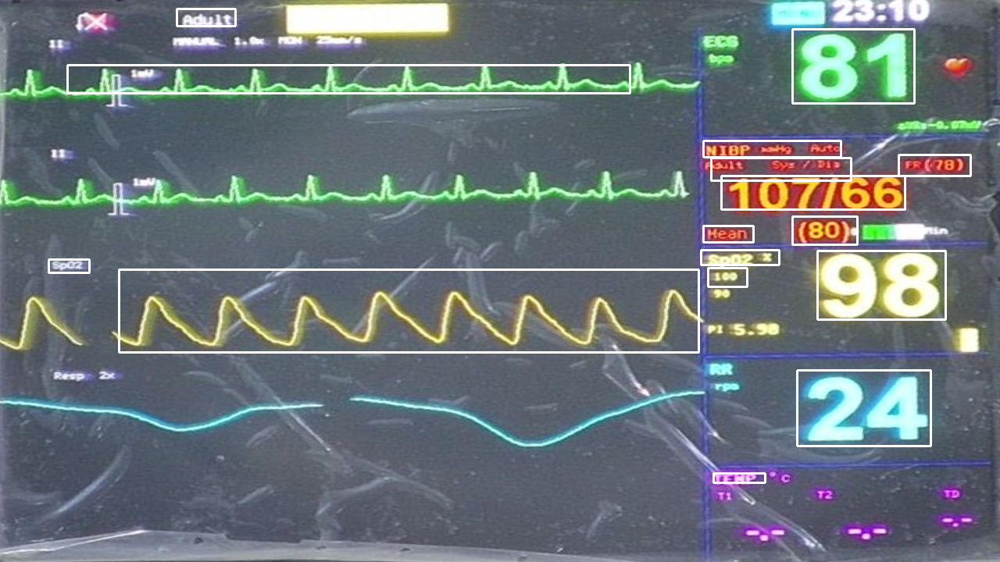

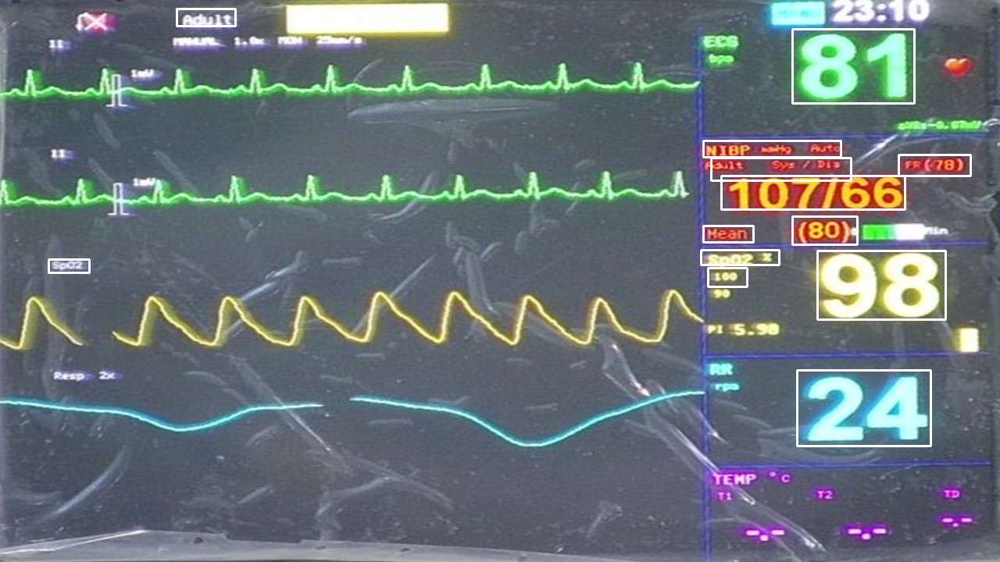

In [ ]:
# # TEST BOX.
IMG_DIR = "/content/TEXT_DETECTION_DATATEST/12.jpeg"
IMG_NAME = IMG_DIR.split('/')[-1]

# Perform the detection
bbox_list = get_im_bbox_list("FCE", IMG_DIR, f'python3 ./PaddleOCR/tools/infer/predict_det.py --image_dir="{IMG_DIR}" --det_model_dir="./inference/det_fce/" --draw_img_save_dir="/content/inference_results" --det_algorithm="FCE"')
plot_bboxes_on_image(IMG_DIR, bbox_list)
# Remove the redundant bboxes
mod_bbox_list, hmax = remove_redundant_bboxes_and_get_bbox_hmax(IMG_DIR, bbox_list)
plot_bboxes_on_image(IMG_DIR, mod_bbox_list)

# suspected_num_bboxes = [bbox for bbox in mod_bbox if abs(bbox[0][1] - bbox[2][1]) > 0.3*hmax]    
# n_ibm = {IMG_NAME: suspected_num_bboxes}
# plot_bboxes_on_images('/'.join(IMG_DIR.split('/')[:-1])+'/', n_ibm)


## Text recognition

### Setup

In [ ]:
!wget 'https://paddleocr.bj.bcebos.com/dygraph_v2.1/rec/rec_r31_sar_train.tar'
!tar -xf rec_r31_sar_train.tar && rm -rf rec_r31_sar_train.tar
%cd ./PaddleOCR
!python3 ./tools/export_model.py -c ./configs/rec/rec_r31_sar.yml -o Global.pretrained_model=/content/rec_r31_sar_train/best_accuracy  Global.save_inference_dir=/content/inference/rec_sar
%cd ..

--2023-02-07 15:59:54--  https://paddleocr.bj.bcebos.com/dygraph_v2.1/rec/rec_r31_sar_train.tar
Resolving paddleocr.bj.bcebos.com (paddleocr.bj.bcebos.com)... 103.235.46.61, 2409:8c04:1001:1002:0:ff:b001:368a
Connecting to paddleocr.bj.bcebos.com (paddleocr.bj.bcebos.com)|103.235.46.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 667349822 (636M) [application/x-tar]
Saving to: ‘rec_r31_sar_train.tar’

rec_r31_sar_train.t 100%[===================>] 636.43M  11.6MB/s    in 74s     

2023-02-07 16:01:11 (8.57 MB/s) - ‘rec_r31_sar_train.tar’ saved [667349822/667349822]

/content/PaddleOCR
[2023/02/07 16:01:28] ppocr INFO: load pretrain successful from /content/rec_r31_sar_train/best_accuracy
[2023/02/07 16:01:46] ppocr INFO: inference model is saved to /content/inference/rec_sar/inference
/content


### Helper

In [ ]:
def get_recognitions(IMG_PATH):
  """
  Input: The log output of the recognition run
  Output: Returns the det_text, det_prob. In case no detection, returns none.
  """
  import re
  log_out = os.popen(f'python3 ./PaddleOCR/tools/infer/predict_rec.py --image_dir="{IMG_PATH}" --rec_model_dir="/content/inference/rec_sar/" --rec_image_shape="3, 48, 48, 160" --rec_algorithm="SAR" --rec_char_dict_path="./PaddleOCR/ppocr/utils/dict90.txt" --max_text_length=30 --use_space_char=False').read()
  pattern = re.compile(r".*Predicts of (.+):\('(.+)', (.+)\)", re.DOTALL)
  match = pattern.match(log_out)
  if match:
    det_text = (match.group(2))
    det_prob = (match.group(3))
    return det_text, det_prob
  else:
    return None
  
# Write a regex to see if the string is a combination of numbers, '(', ')', '/'
def includes_num_bracks_slash(string):
  import re
  pattern = re.compile(r'(\d+|\(|\)|/)+')
  match = pattern.match(string)
  if match:
      return True
  return False

def includes_alpha_numeric(string):
  import re
  pattern = re.compile(r'(.*[a-zA-Z]+).*')
  match = pattern.match(string)
  if match:
      return True
  return False

from google.colab.patches import cv2_imshow    

def plot_detect_bboxes(segim_og, detections, mod_bbox_list):
  # detections is list of lists, where each list elem is (bbox_id, pred_text, pred_conf)
  # Plot the bboxes along with text, prob on the segim and display the plot
  # Use cv2.putText to write the text and prob on the segim
  # Use cv2.rectangle to draw the bbox on the segim
  # Use cv2.imshow to display the segim
  import cv2
  import copy
  segim = copy.deepcopy(segim_og)
  for bbox_id, pred_text, pred_conf in detections:
      bbox_list = mod_bbox_list[bbox_id]
      lt = (int(bbox_list[0][0]), int(bbox_list[0][1]))
      rb = (int(bbox_list[2][0]), int(bbox_list[2][1]))
      cv2.rectangle(segim, lt, rb, (0, 0, 255), 2)
      cv2.putText(segim, pred_text, (lt[0], max(lt[1]-5, 0) ), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
      # cv2.putText(segim, str(pred_conf), (lt[0], lt[1]+20), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
  cv2_imshow( segim)

def get_possible_vital_numbers(num_detections1, mod_bbox_list):
  # Get the numbers who have height greater than 40% of hmax
  # Return the num_detections list
  import copy
  num_detections = copy.deepcopy(num_detections1)
  hmax = 0
  for det in num_detections: #Remove the numbers who have height less than
      bbox_id, pred_text, pred_conf = det
      bbox = mod_bbox_list[bbox_id]
      lt = (bbox[0][0], bbox[0][1]); rb = (bbox[2][0], bbox[2][1])
      h = abs(lt[1] - rb[1])
      if h > hmax:
          hmax = h
  # Remove the numbers who have height less than 40% of hmax
  return [det for det in num_detections if abs(mod_bbox_list[det[0]][0][1] - mod_bbox_list[det[0]][2][1]) > 0.4*hmax]

def get_possible_vital_labels(detections, text_detections):
    for idx, det in enumerate(detections):
        if (includes_alpha_numeric(det[0])):
            text_detections.append([idx, det[0], det[1]])


VITAL_CLASS_LABELS = {
    'HR': ['HR', 'Heart', 'ECG'],
    
    'RR': ['RR', 'Respiration', 'Resp'],

    'SBP': ['SBP', 'Systolic', 'Sys', 'Blood', 'Pressure'],
    'DBP': ['DBP', 'Diastolic', 'Dia', 'Blood', 'Pressure'],
    'MAP': ['MAP', 'Mean'],
    'NBP_HINT_CLASS': ['NBP', 'NIBP', 'AIBP', 'mmhg'],
    
    'SPO2': ['SPO2', 'SpO2', 'Oxygen', 'SPO'],
}

def filter_bboxes_with_vital_labels(text_detections):
    # Filter the text_detections list to get only the bboxes with vital labels
    # Return the filtered list
    filtered_text_detections = []
    for det in text_detections:
        for key, val in VITAL_CLASS_LABELS.items():
            for v in val:
                if v.lower() in det[1].lower():
                    filtered_text_detections.append(det)
                    break
    return filtered_text_detections

def get_vital_class_label(text):
    # Get the class label for the text
    # Return the class label
    for key, val in VITAL_CLASS_LABELS.items():
        for v in val:
            if v.lower() in text.lower():
                return key
    return None

### Test

In [ ]:
# get_detections('/content/cropped_images/cropped_0.jpg')

# Main Pipeline

In [ ]:
!gdown 1t2KX9j99GCdnC3KpNkmva95uVgqaxPDB
!unzip small_test_dataset.zip

Downloading...
From: https://drive.google.com/uc?id=1t2KX9j99GCdnC3KpNkmva95uVgqaxPDB
To: /content/small_test_dataset.zip
100% 1.32M/1.32M [00:00<00:00, 100MB/s]
Archive:  small_test_dataset.zip
   creating: small_test_dataset/
  inflating: small_test_dataset/adityawarangal_icu_mon--01_2023_1_3_14_15_1.jpeg  
  inflating: small_test_dataset/adityawarangal_icu_mon--06_2023_1_5_16_15_23.jpeg  
  inflating: small_test_dataset/drpremhospital_icu_mon--C_2023_1_1_12_25_51.jpeg  
  inflating: small_test_dataset/drpremhospital_icu_mon--D_2023_1_1_23_25_45.jpeg  
  inflating: small_test_dataset/drpremhospital_icu_mon--D_2023_1_2_2_26_11.jpeg  
  inflating: small_test_dataset/lifecarehospital_icu_mon--216_2023_1_5_13_15_12.jpeg  
  inflating: small_test_dataset/lifecarehospital_icu_mon--216_2023_1_6_1_15_1.jpeg  
  inflating: small_test_dataset/medicasiliguri_ccu_mon--1_2023_1_1_11_15_1.jpeg  
  inflating: small_test_dataset/maasharadavikarabad_icu_mon--01_2023_1_3_6_15_2.jpeg  
  inflating: sma

#### Test 1

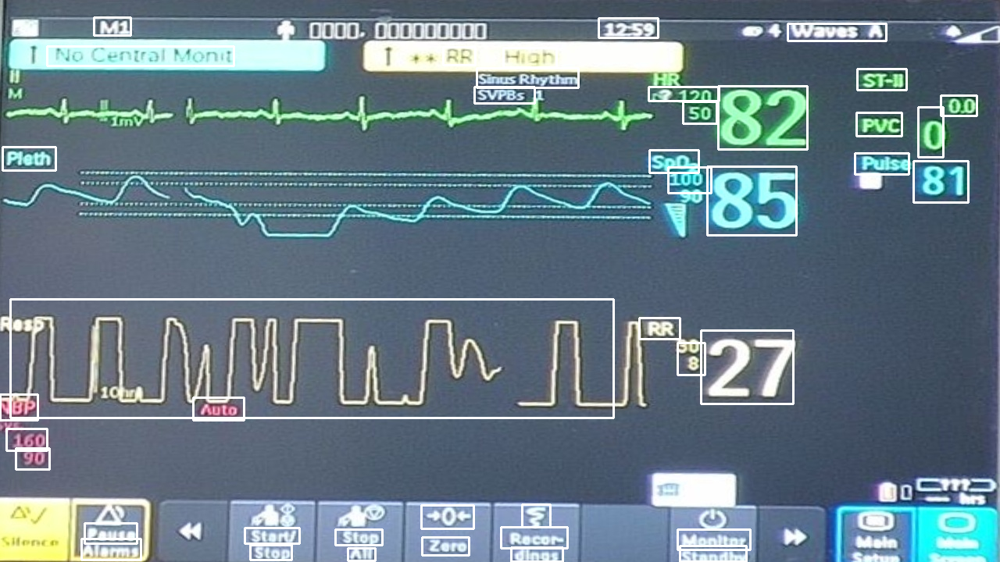

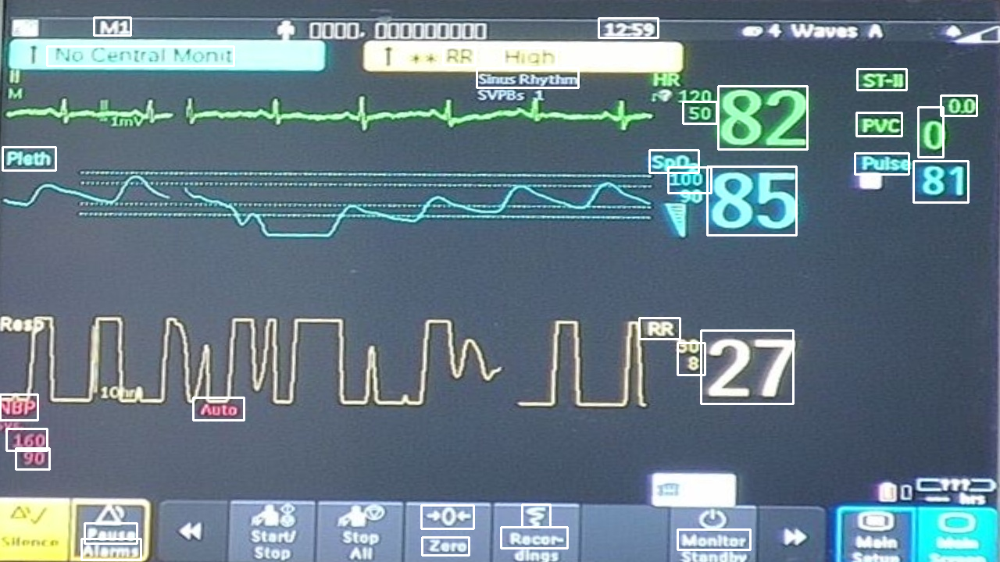

Trying cropped_0.jpg..
Trying cropped_1.jpg..
Trying cropped_2.jpg..
Trying cropped_3.jpg..
Trying cropped_4.jpg..
Trying cropped_5.jpg..
Trying cropped_6.jpg..
Trying cropped_7.jpg..
Trying cropped_8.jpg..
Trying cropped_9.jpg..
Trying cropped_10.jpg..
Trying cropped_11.jpg..
Trying cropped_12.jpg..
Trying cropped_13.jpg..
Trying cropped_14.jpg..
Trying cropped_15.jpg..
Trying cropped_16.jpg..
Trying cropped_17.jpg..
Trying cropped_18.jpg..
Trying cropped_19.jpg..
Trying cropped_20.jpg..
Trying cropped_21.jpg..
Trying cropped_22.jpg..
Trying cropped_23.jpg..
Trying cropped_24.jpg..
Trying cropped_25.jpg..
Trying cropped_26.jpg..
Trying cropped_27.jpg..
Trying cropped_28.jpg..
Trying cropped_29.jpg..
Trying cropped_30.jpg..
Trying cropped_31.jpg..


In [ ]:
im_path = '/content/small_test_dataset/adityawarangal_icu_mon--01_2023_1_3_14_15_1.jpeg'
im_name = im_path.split('/')[-1]
# plt.imshow(plt.imread(im_path))
# plt.show()

#############
# Segmentation
#############
segim = run_segmentation_and_warping(im_path) # Segmented+Warped image
# If segmented_images dir dne create it
if not os.path.exists('segmented_images'):
  os.makedirs('segmented_images')
seg_im_path = 'segmented_images/segim_{}.jpg'.format(im_name.split('.')[0])
cv2.imwrite(seg_im_path, segim)

# plt.imshow(plt.imread('segmented_images/segim_{}.jpg'.format(im_name.split('.')[0])))

#############
# Detection
#############
bbox_list = get_im_bbox_list("FCE", seg_im_path, f'python3 ./PaddleOCR/tools/infer/predict_det.py --image_dir="{seg_im_path}" --det_model_dir="./inference/det_fce/" --draw_img_save_dir="/content/inference_results" --det_algorithm="FCE"')
plot_bboxes_on_image(seg_im_path, bbox_list)
# Remove the redundant bboxes
mod_bbox_list, hmax = remove_redundant_bboxes_and_get_bbox_hmax(seg_im_path, bbox_list)
plot_bboxes_on_image(seg_im_path, mod_bbox_list)

# Saving the detections to the /content/cropped_images/ dir
save_cropped_images(seg_im_path, mod_bbox_list)


#############
# Recognition
#############
detections = [] # Holds the tuple of (pred_text, pred_prob) for each of the bbox in order
num_detections = [] # List of lists, where each list elem is (bbox_id, pred_text, pred_conf)
text_detections = [] # List of lists, where each list elem is (bbox_id, pred_text, pred_conf)
for i in range(len(mod_bbox_list)):
  
  crp_img_name = f'cropped_{i}.jpg'
  print(f"Trying {crp_img_name}..")
  pred_text, pred_prob = get_recognitions( os.path.join('/content/cropped_images', crp_img_name) )
  detections.append( (pred_text, pred_prob) )
  if(includes_num_bracks_slash(pred_text)):
    num_detections.append( [i, pred_text, pred_prob] )


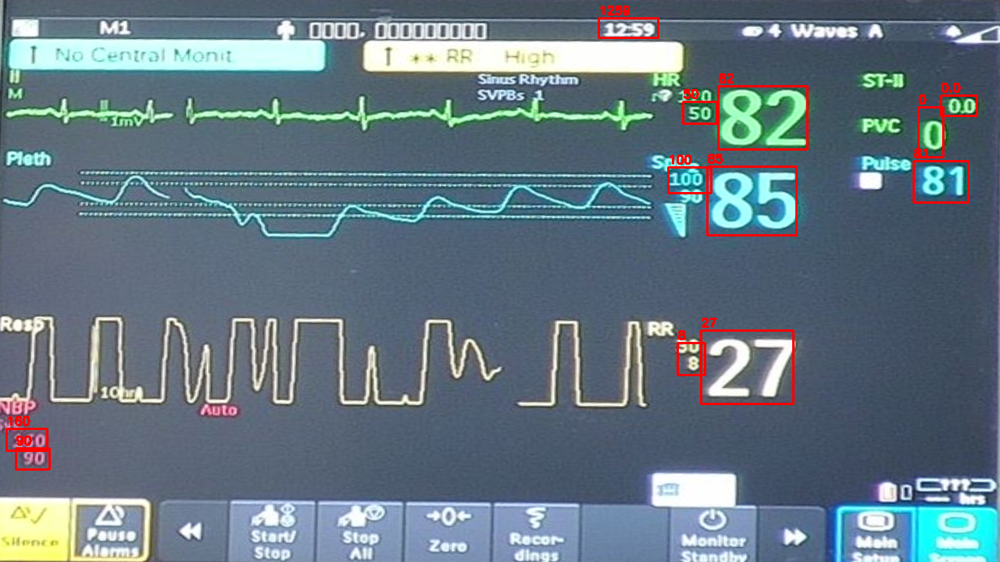

In [ ]:
# To show the 'number' detections
plot_detect_bboxes(segim, num_detections,mod_bbox_list) 

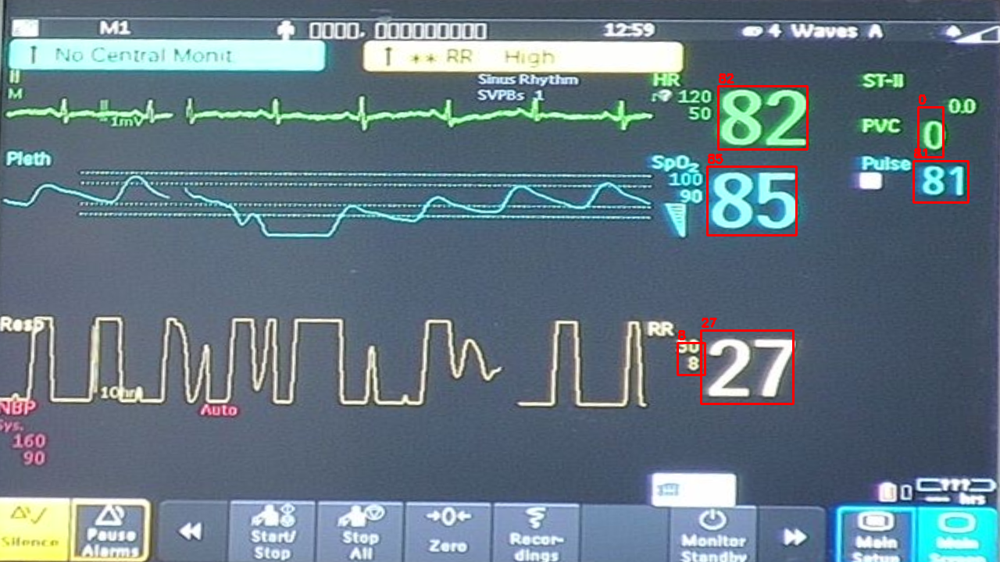

In [ ]:
# Removing the bboxes having less than 40% of the hmax from the nubmer bboxes
mod_num_detections = get_possible_vital_numbers(num_detections, mod_bbox_list)
plot_detect_bboxes(segim, mod_num_detections,mod_bbox_list)

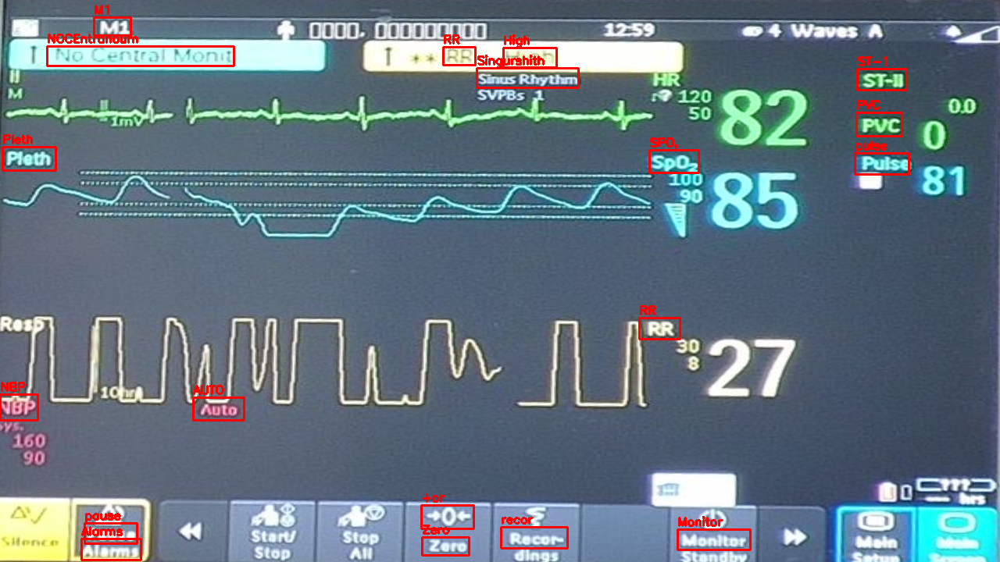

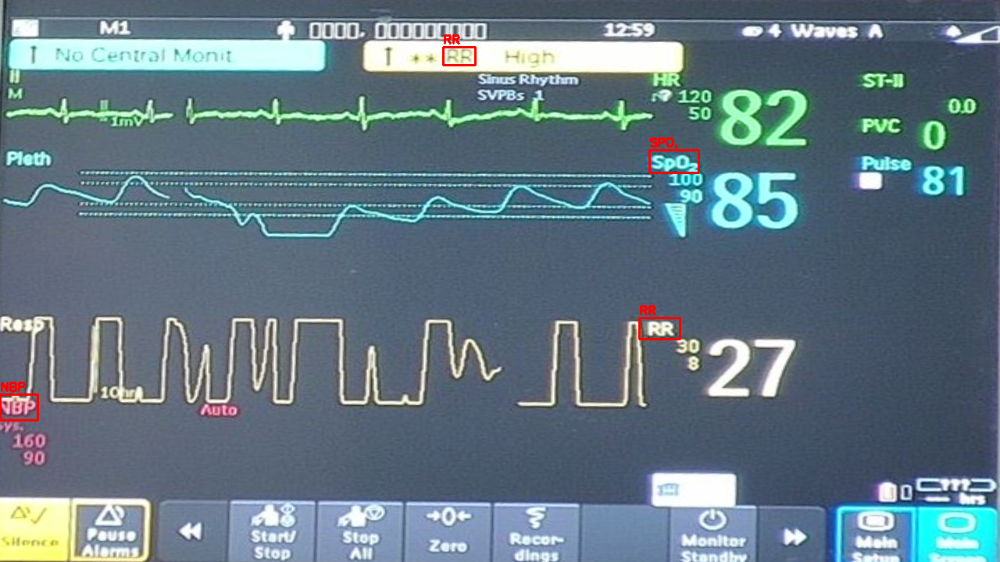

In [ ]:
# Get text labels first
get_possible_vital_labels(detections, text_detections)
plot_detect_bboxes(segim, text_detections, mod_bbox_list)

# Filtering the vital text boxes only
vital_text_detections = filter_bboxes_with_vital_labels(text_detections)
plot_detect_bboxes(segim, vital_text_detections, mod_bbox_list)

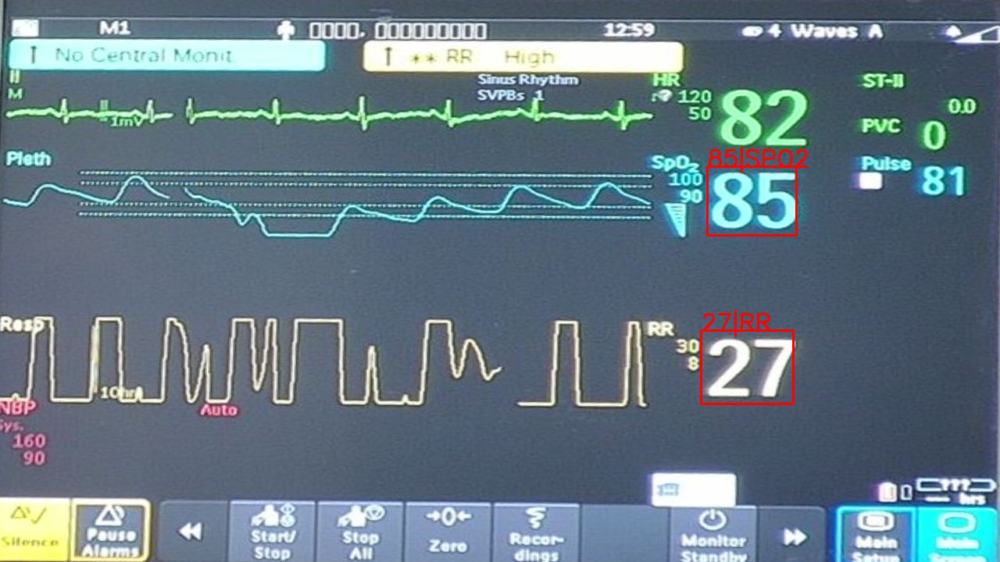

In [ ]:
def find_bbox_label_correlations(seg_img1, text_detects1, num_detects1, mod_bbox_list):
    """
    Input: 
        - text_detects: list of lists, where each list elem is (bbox_id, pred_text, pred_conf)
        - num_detects: list of lists, where each list elem is (bbox_id, pred_text, pred_conf)
    Output:
        - vital_val_dict: {'HR':val1, 'RR':val2, 'SBP':val3, 'DBP':val4, 'MAP':val5, 'SPO2':val6}
    """
    import copy
    seg_img = copy.deepcopy(seg_img1)
    text_detects = copy.deepcopy(text_detects1)
    num_detects = copy.deepcopy(num_detects1)

    # Sort the num_detects bboxes by their y-coordinates, then by their areas to maintain the order along the y axis
    num_detects.sort(key=lambda x: 
        (
        # mod_bbox_list[x[0]][0][1],
        abs(mod_bbox_list[x[0]][0][0] - mod_bbox_list[x[0]][2][0])*abs(mod_bbox_list[x[0]][0][1] - mod_bbox_list[x[0]][2][1])
        ),
        reverse=True
        )
    
    # Sort the text_detects bboxes by their y-coordinates
    text_detects.sort(key=lambda x: (mod_bbox_list[x[0]][0][1]), reverse=False)

    final_detections = [] # list of lists, where elem list will have num_bbox_coords, vital_label, num_value, prob_text

    for i in range(6): # Try out matching at max the top 6(by area) number detections.
      import math
      num_detect = num_detects[i]
      num_bbox_id, num_pred_text, num_pred_conf = num_detect
      num_bbox = mod_bbox_list[num_bbox_id]
      cent_bbox = ((num_bbox[0][0] + num_bbox[2][0])//2, (num_bbox[0][1] + num_bbox[2][1])//2)
      diag_len_bbox = int(math.sqrt((num_bbox[0][0] - num_bbox[2][0])**2 + (num_bbox[0][1] - num_bbox[2][1])**2))
      
      min_dist = 10000000
      min_dist_text_detect = None
      for j in range(len(text_detects)):
          # Check every text detection block which has a y <= cent_bbox[1] and is within the 1.5*diag_len_bbox of cent_bbox
          text_detect = text_detects[j]
          text_bbox_id, text_pred_text, text_pred_conf = text_detect
          text_bbox = mod_bbox_list[text_bbox_id]
          if text_bbox[0][1]>cent_bbox[1]:
              break
          if abs(text_bbox[0][0] - cent_bbox[0]) > 1.5*diag_len_bbox:
              continue
          cent_text_bbox = ((text_bbox[0][0] + text_bbox[2][0])//2, (text_bbox[0][1] + text_bbox[2][1])//2)
          # Calculate the distance between the centers of the two bboxes
          dist = math.sqrt((cent_bbox[0] - cent_text_bbox[0])**2 + (cent_bbox[1] - cent_text_bbox[1])**2)
          if dist < min_dist:
              min_dist = dist
              min_dist_idx = j
              min_dist_text_detect = text_detect
      
      if min_dist_text_detect is not None:
            vital_name = get_vital_class_label(min_dist_text_detect[1])
          #if final_detections already have vital_name then check if the current 
            if len(final_detections)>0:
                for idx, det in enumerate(final_detections):
                    if det[1] == vital_name:
                        bbox_1=det[0]
                        bbox_2=final_detections[idx][0]
                        # if the current bbox area is bigger than the previous bbox area then replace the final_detections
                        if abs(bbox_1[0][0] - bbox_1[2][0])*abs(bbox_1[0][1] - bbox_1[2][1]) > abs(bbox_2[0][0] - bbox_2[2][0])*abs(bbox_2[0][1] - bbox_2[2][1]):
                            final_detections[idx] = [num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]]
                        break
                    else:
                        # print("wo")
                        final_detections.append([num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]])
            # final_detections.append([num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]])
            else:
                # print("wo")
                final_detections.append([num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]])
    
    # PLOT FOR DEBUG
    for idx, det in enumerate(final_detections):
        import cv2
        bbox, vital_name, num_value, prob_text = det
        lt = (int(bbox[0][0]), int(bbox[0][1])); rb = (int(bbox[2][0]), int(bbox[2][1]))
        cv2.putText(seg_img, str(num_value)+'|'+str(vital_name), lt, cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        cv2.rectangle(seg_img, lt, rb, (0, 0, 255), 2)
    cv2_imshow(seg_img)
  # print("Final detections ", final_detections)
         
find_bbox_label_correlations(segim, vital_text_detections, mod_num_detections, mod_bbox_list)
    
# print(mod_num_detections)


In [ ]:
import shutil
shutil.rmtree('/content/cropped_images')

#### Test 2

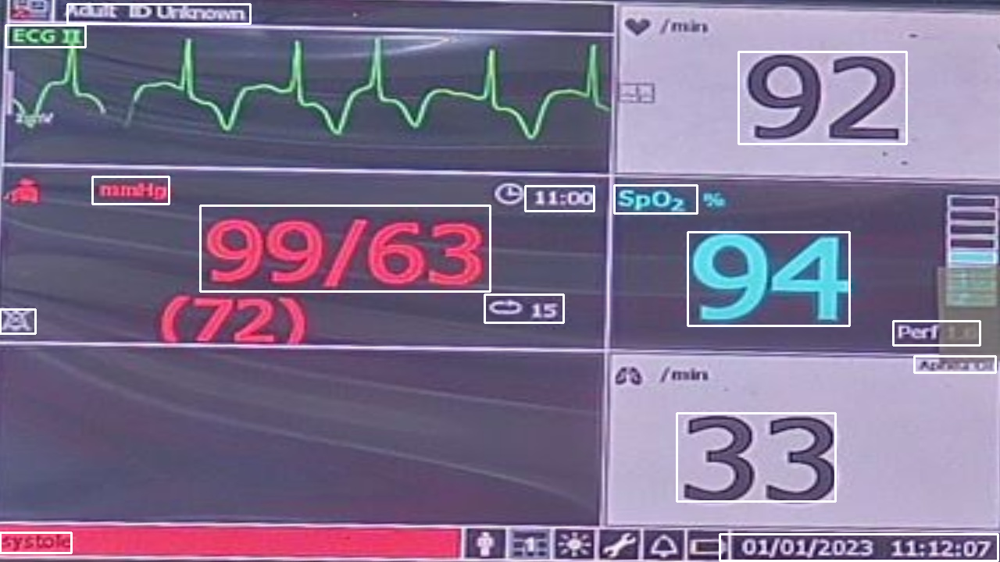

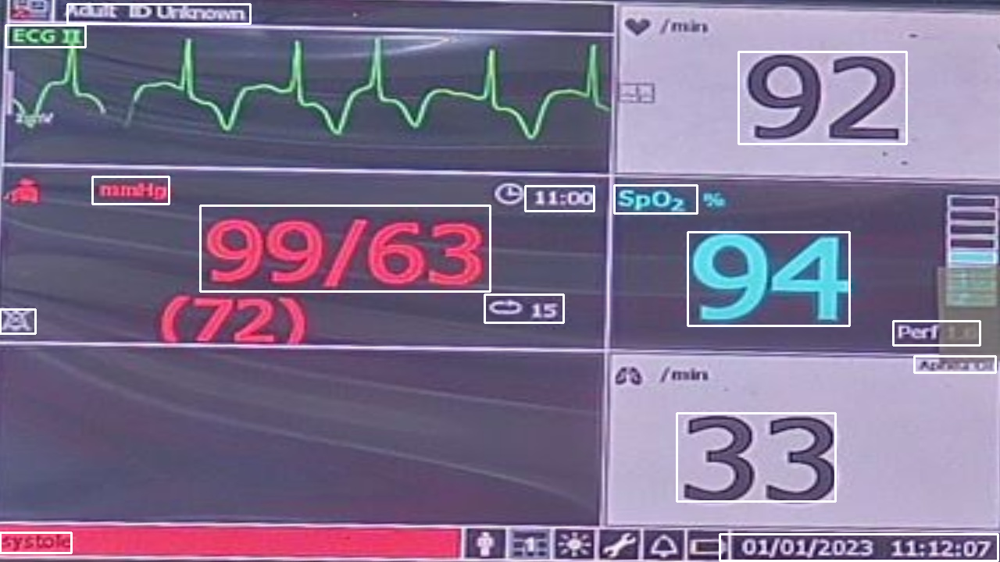

Trying cropped_0.jpg..
Trying cropped_1.jpg..
Trying cropped_2.jpg..
Trying cropped_3.jpg..
Trying cropped_4.jpg..
Trying cropped_5.jpg..
Trying cropped_6.jpg..
Trying cropped_7.jpg..
Trying cropped_8.jpg..
Trying cropped_9.jpg..
Trying cropped_10.jpg..
Trying cropped_11.jpg..
Trying cropped_12.jpg..
Trying cropped_13.jpg..
Trying cropped_14.jpg..


In [ ]:
im_path = '/content/small_test_dataset/medicasiliguri_ccu_mon--1_2023_1_1_11_15_1.jpeg'
im_name = im_path.split('/')[-1]
# plt.imshow(plt.imread(im_path))
# plt.show()

#############
# Segmentation
#############
segim = run_segmentation_and_warping(im_path) # Segmented+Warped image
# If segmented_images dir dne create it
if not os.path.exists('segmented_images'):
  os.makedirs('segmented_images')
seg_im_path = 'segmented_images/segim_{}.jpg'.format(im_name.split('.')[0])
cv2.imwrite(seg_im_path, segim)

# plt.imshow(plt.imread('segmented_images/segim_{}.jpg'.format(im_name.split('.')[0])))

#############
# Detection
#############
bbox_list = get_im_bbox_list("FCE", seg_im_path, f'python3 ./PaddleOCR/tools/infer/predict_det.py --image_dir="{seg_im_path}" --det_model_dir="./inference/det_fce/" --draw_img_save_dir="/content/inference_results" --det_algorithm="FCE"')
plot_bboxes_on_image(seg_im_path, bbox_list)
# Remove the redundant bboxes
mod_bbox_list, hmax = remove_redundant_bboxes_and_get_bbox_hmax(seg_im_path, bbox_list)
plot_bboxes_on_image(seg_im_path, mod_bbox_list)

# Saving the detections to the /content/cropped_images/ dir
save_cropped_images(seg_im_path, mod_bbox_list)


#############
# Recognition
#############
detections = [] # Holds the tuple of (pred_text, pred_prob) for each of the bbox in order
num_detections = [] # List of lists, where each list elem is (bbox_id, pred_text, pred_conf)
text_detections = [] # List of lists, where each list elem is (bbox_id, pred_text, pred_conf)
for i in range(len(mod_bbox_list)):
  
  crp_img_name = f'cropped_{i}.jpg'
  print(f"Trying {crp_img_name}..")
  pred_text, pred_prob = get_recognitions( os.path.join('/content/cropped_images', crp_img_name) )
  detections.append( (pred_text, pred_prob) )
  if(includes_num_bracks_slash(pred_text)):
    num_detections.append( [i, pred_text, pred_prob] )


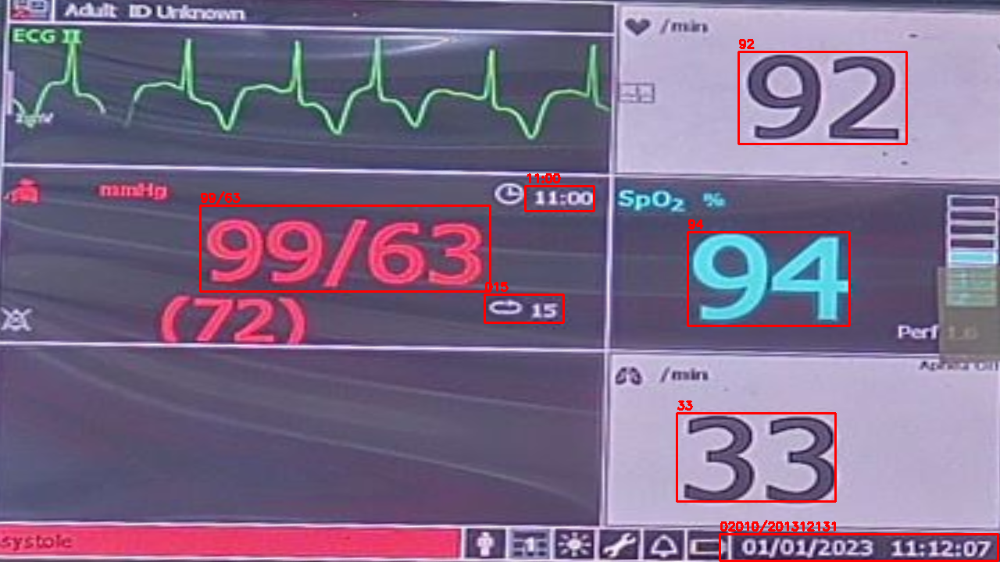

In [ ]:
# To show the 'number' detections
plot_detect_bboxes(segim, num_detections,mod_bbox_list) 

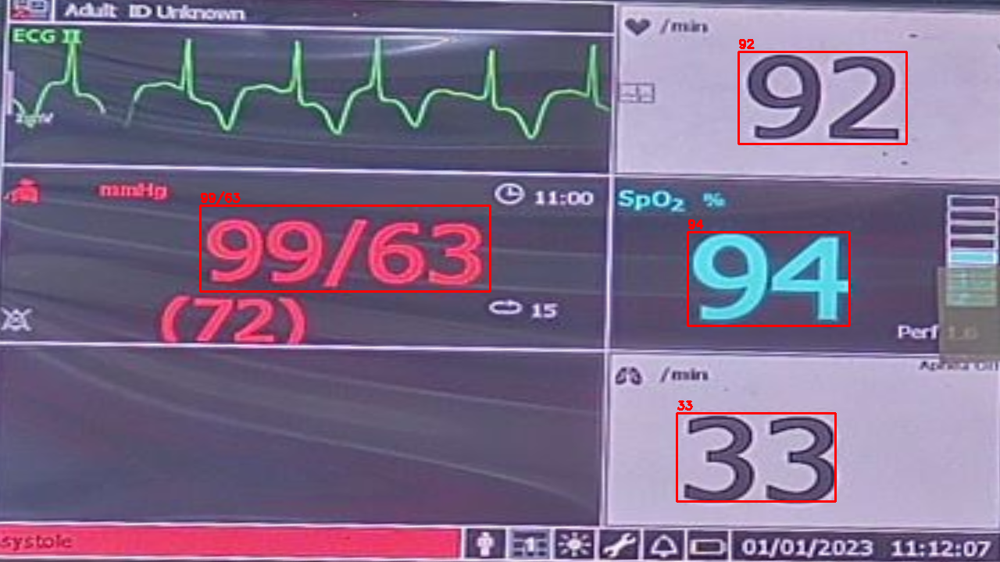

In [ ]:
# Removing the bboxes having less than 40% of the hmax from the nubmer bboxes
mod_num_detections = get_possible_vital_numbers(num_detections, mod_bbox_list)
plot_detect_bboxes(segim, mod_num_detections,mod_bbox_list)

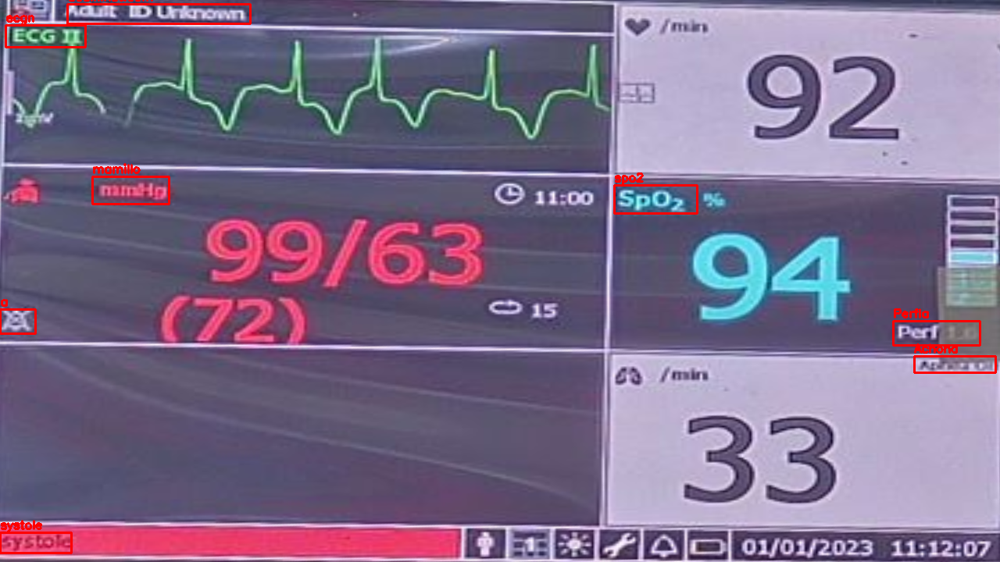

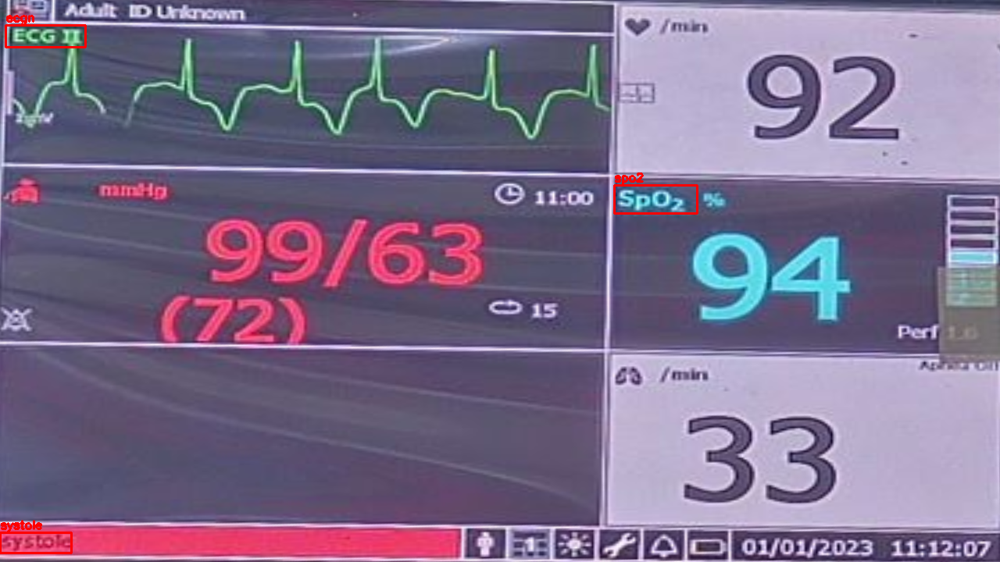

In [ ]:
# Get text labels first
get_possible_vital_labels(detections, text_detections)
plot_detect_bboxes(segim, text_detections, mod_bbox_list)

# Filtering the vital text boxes only
vital_text_detections = filter_bboxes_with_vital_labels(text_detections)
plot_detect_bboxes(segim, vital_text_detections, mod_bbox_list)

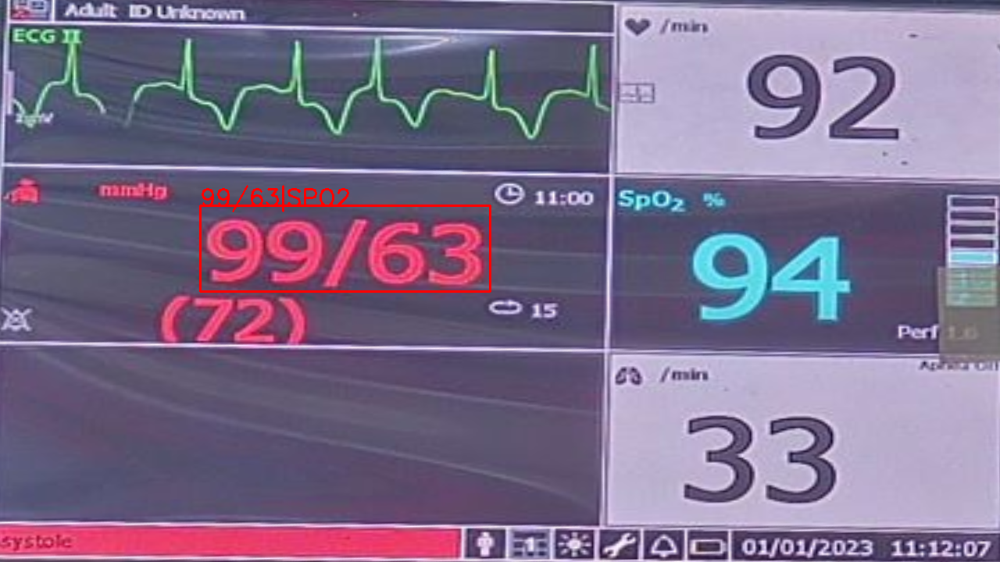

In [ ]:
def find_bbox_label_correlations(seg_img1, text_detects1, num_detects1, mod_bbox_list):
    """
    Input: 
        - text_detects: list of lists, where each list elem is (bbox_id, pred_text, pred_conf)
        - num_detects: list of lists, where each list elem is (bbox_id, pred_text, pred_conf)
    Output:
        - vital_val_dict: {'HR':val1, 'RR':val2, 'SBP':val3, 'DBP':val4, 'MAP':val5, 'SPO2':val6}
    """
    import copy
    seg_img = copy.deepcopy(seg_img1)
    text_detects = copy.deepcopy(text_detects1)
    num_detects = copy.deepcopy(num_detects1)

    # Sort the num_detects bboxes by their y-coordinates, then by their areas to maintain the order along the y axis
    num_detects.sort(key=lambda x: 
        (
        # mod_bbox_list[x[0]][0][1],
        abs(mod_bbox_list[x[0]][0][0] - mod_bbox_list[x[0]][2][0])*abs(mod_bbox_list[x[0]][0][1] - mod_bbox_list[x[0]][2][1])
        ),
        reverse=True
        )
    
    # Sort the text_detects bboxes by their y-coordinates
    text_detects.sort(key=lambda x: (mod_bbox_list[x[0]][0][1]), reverse=False)

    final_detections = [] # list of lists, where elem list will have num_bbox_coords, vital_label, num_value, prob_text
    i=min(6,len(num_detects))
    for i in range(i): # Try out matching at max the top 6(by area) number detections.
      import math
      num_detect = num_detects[i]
      num_bbox_id, num_pred_text, num_pred_conf = num_detect
      num_bbox = mod_bbox_list[num_bbox_id]
      cent_bbox = ((num_bbox[0][0] + num_bbox[2][0])//2, (num_bbox[0][1] + num_bbox[2][1])//2)
      diag_len_bbox = int(math.sqrt((num_bbox[0][0] - num_bbox[2][0])**2 + (num_bbox[0][1] - num_bbox[2][1])**2))
      
      min_dist = 10000000
      min_dist_text_detect = None
      for j in range(len(text_detects)):
          # Check every text detection block which has a y <= cent_bbox[1] and is within the 1.5*diag_len_bbox of cent_bbox
          text_detect = text_detects[j]
          text_bbox_id, text_pred_text, text_pred_conf = text_detect
          text_bbox = mod_bbox_list[text_bbox_id]
          if text_bbox[0][1]>cent_bbox[1]:
              break
          if abs(text_bbox[0][0] - cent_bbox[0]) > 1.5*diag_len_bbox:
              continue
          cent_text_bbox = ((text_bbox[0][0] + text_bbox[2][0])//2, (text_bbox[0][1] + text_bbox[2][1])//2)
          # Calculate the distance between the centers of the two bboxes
          dist = math.sqrt((cent_bbox[0] - cent_text_bbox[0])**2 + (cent_bbox[1] - cent_text_bbox[1])**2)
          if dist < min_dist:
              min_dist = dist
              min_dist_idx = j
              min_dist_text_detect = text_detect
      
      if min_dist_text_detect is not None:
            vital_name = get_vital_class_label(min_dist_text_detect[1])
          #if final_detections already have vital_name then check if the current 
            if len(final_detections)>0:
                for idx, det in enumerate(final_detections):
                    if det[1] == vital_name:
                        bbox_1=det[0]
                        bbox_2=final_detections[idx][0]
                        # if the current bbox area is bigger than the previous bbox area then replace the final_detections
                        if abs(bbox_1[0][0] - bbox_1[2][0])*abs(bbox_1[0][1] - bbox_1[2][1]) > abs(bbox_2[0][0] - bbox_2[2][0])*abs(bbox_2[0][1] - bbox_2[2][1]):
                            final_detections[idx] = [num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]]
                        break
                    else:
                        # print("wo")
                        final_detections.append([num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]])
            # final_detections.append([num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]])
            else:
                # print("wo")
                final_detections.append([num_bbox, vital_name, num_pred_text, min_dist_text_detect[2]])
    
    # PLOT FOR DEBUG
    for idx, det in enumerate(final_detections):
        import cv2
        bbox, vital_name, num_value, prob_text = det
        lt = (int(bbox[0][0]), int(bbox[0][1])); rb = (int(bbox[2][0]), int(bbox[2][1]))
        cv2.putText(seg_img, str(num_value)+'|'+str(vital_name), lt, cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        cv2.rectangle(seg_img, lt, rb, (0, 0, 255), 2)
    cv2_imshow(seg_img)
  # print("Final detections ", final_detections)
         
find_bbox_label_correlations(segim, vital_text_detections, mod_num_detections, mod_bbox_list)
    
# print(mod_num_detections)
